Comparison Paper 1 vs 2

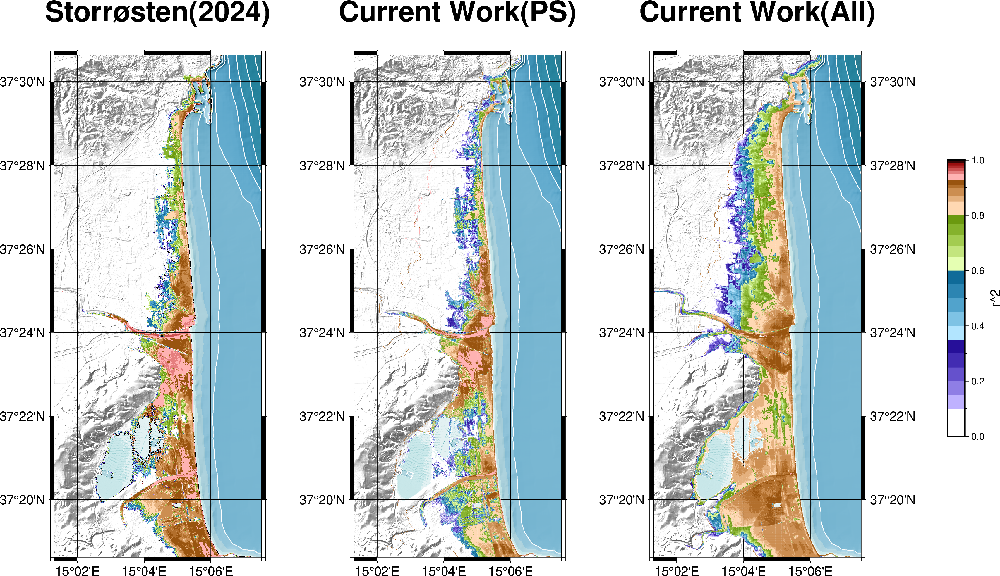

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import pygmt

#select particular representative gauge
reg = 'CT'
list_size = ['892','1658','3454','7071']   
columnname = str(38)
mask_size = '892'
train_size = list_size[1]

# Load the elevation from netcdf grid
grid_CT = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
#get lat long limits from the grid
ymin = grid_CT['y'].min().values
ymax = grid_CT['y'].max().values
xmin = grid_CT['x'].min().values
xmax = grid_CT['x'].max().values

grid_CT_P1 = xr.open_dataset('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2_topo_test.nc',engine='netcdf4')
temp = grid_CT_P1['r2topo']
temp = temp.where(temp>0,0)
grid_CT_P1['r2topo'] = temp

# Plot grid
fig = pygmt.Figure()

with fig.subplot(
        nrows=1,
        ncols=3,
        subsize = ["8c","20c"],
        sharey = True,
        frame = ["ag"],
        ):
    with fig.set_panel(panel=[0,0]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tStorrøsten(2024)"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2only.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False)
        fig.grdimage(grid_CT_P1['r2topo'],cmap = True,projection='M6c',nan_transparent='+z0',frame = ["ag"])
    
    with fig.set_panel(panel=[0,1]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tCurrent Work(PS)"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2only.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False)
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
        idx_val = idx_val[~(idx_val['r2_PS'] >= 1)]
        idx_val = idx_val[~(idx_val['r2_PS'] <= 0)]
        idx_val = idx_val[~idx_val['r2_PS'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['r2_PS'],style='s0.01c',cmap = True,projection='M6c',frame = ["ag"])

    with fig.set_panel(panel=[0,2]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tCurrent Work(All)"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2only.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False)
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}.txt', sep=",")
        idx_val = idx_val[~(idx_val['r2'] >= 1)]
        idx_val = idx_val[~(idx_val['r2'] <= 0)]
        idx_val = idx_val[~idx_val['r2'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['r2'],style='s0.01c',cmap = True,projection='M6c',frame = ["ag"])
        fig.colorbar(frame=["x+lr^2"], position="JMR+o0.5c/-2.5c+w8c/0.5c") 
    # with fig.set_panel(panel=[0,3]):
    #     cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
    #     cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
    #     fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tCurrent Work(All Prob.Wt)"])
    #     fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
    #     cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2only.cpt'
    #     cmap = pygmt.makecpt(cmap=cptfile, continuous=False)
    #     idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
    #     idx_val = idx_val[~(idx_val['r2_test_imp'] <= 0)]
    #     idx_val = idx_val[~idx_val['r2_test_imp'].isna()]
    #     fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['r2_test_imp'],style='s0.01c',cmap = True,projection='M6c',frame = ["ag"])
    #     fig.colorbar(frame=["x+lr^2", "y+lm"], position="JMR+o0c/-2.5c+w8c/0.5c")
#save
savefile = f'plots/Grid_scores_{train_size}_{reg}_PSHalf_all.png'
fig.savefig(savefile,dpi=300)
fig.show()

xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: Encountered first invalid binary data record near/at line # 579439
xyz2grd [WARNING]: Likely causes:
xyz2grd [WARNING]: (1) Invalid x and/or y values, i.e. NaNs.


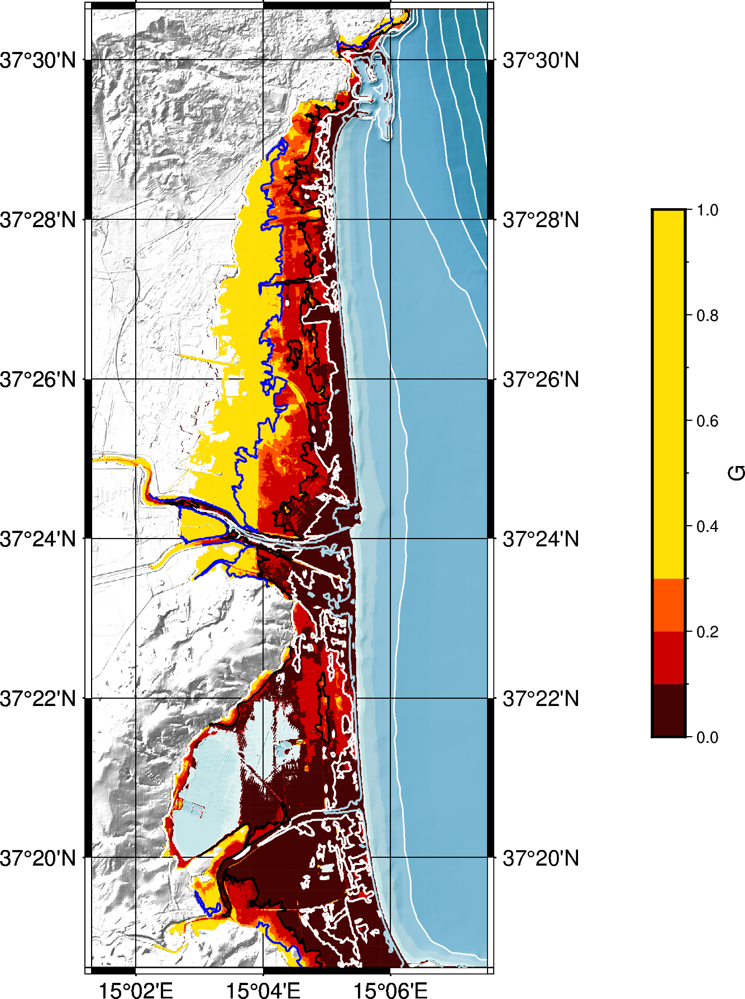

In [2]:
import pandas as pd
import numpy as np
import xarray as xr
import pygmt

pygmt.config(FORMAT_FLOAT_MAP="%1.1e")  
#select particular representative gauge
reg = 'CT'
list_size = ['892','1658','3454','7071']   
columnname = str(38)
mask_size = '892'
train_size = list_size[1]

# Load the elevation from netcdf grid
grid_CT = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
#get lat long limits from the grid
ymin = grid_CT['y'].min().values
ymax = grid_CT['y'].max().values
xmin = grid_CT['x'].min().values
xmax = grid_CT['x'].max().values

grid_CT_P1 = xr.open_dataset('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2_topo_test.nc',engine='netcdf4')
temp = grid_CT_P1['r2topo']
temp = temp.where(temp>0,0)
grid_CT_P1['r2topo'] = temp

# Plot grid
fig = pygmt.Figure()

with fig.subplot(
        nrows=1,
        ncols=1,
        subsize = ["8","20c"],
        sharey = True,
        frame = ["ag"],
        clearance  = "w4.5c",
        ):
    with fig.set_panel(panel=[0,0]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        #save cmap as cpt file
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c')
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/gPTHA.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False,background='white')
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}.txt', sep=",")
        ex_rate = np.load(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/true_PTHArate_53550.npy')
        grid_rate = pygmt.xyz2grd(x=idx_val['lon'], y=idx_val['lat'], z=ex_rate[:,1], spacing='1s', region=[xmin,xmax,ymin,ymax])
        idx_val = idx_val[~idx_val['Gfit'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['Gfit'],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"])
        fig.grdcontour(grid_rate, levels=[1e-4], pen='0.75p,lightblue', limit=[1e-8,1e-3],projection='M6c',cut=10)
        fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c',cut=10)
        fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c',cut=100)
        fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c',cut=100)
        fig.colorbar(frame=["x+lG"], position="JMR+o5c/-2.5c+w8c/0.5c")
#save
savefile = f'plots/Grid_scores_{train_size}_{reg}_G.png'
fig.savefig(savefile,dpi=300)
fig.show()

xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: Encountered first invalid binary data record near/at line # 579439
xyz2grd [WARNING]: Likely causes:
xyz2grd [WARNING]: (1) Invalid x and/or y values, i.e. NaNs.


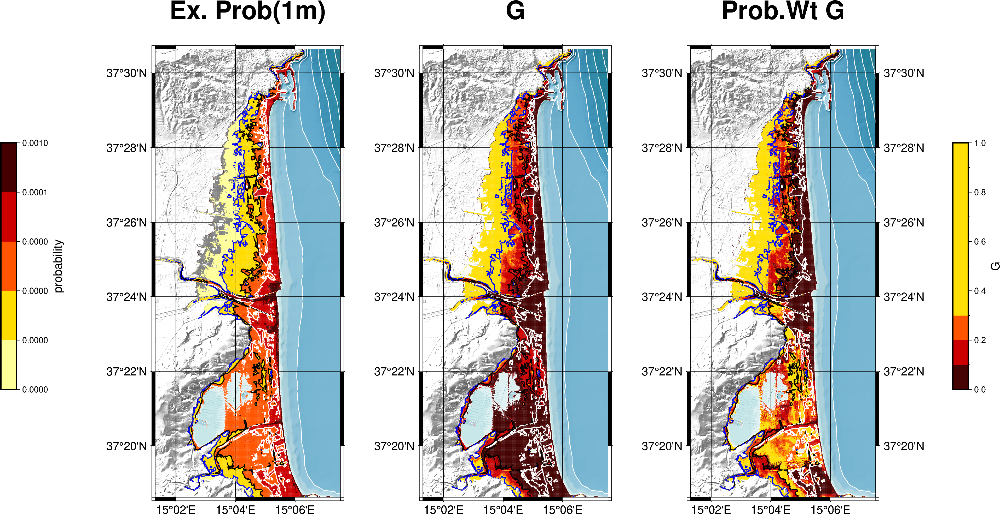

In [3]:
import pandas as pd
import numpy as np
import xarray as xr
import pygmt

pygmt.config(FORMAT_FLOAT_MAP="%1.1e")  
#select particular representative gauge
reg = 'CT'
list_size = ['892','1658','3454','7071']   
columnname = str(38)
mask_size = '892'
train_size = list_size[1]

# Load the elevation from netcdf grid
grid_CT = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
#get lat long limits from the grid
ymin = grid_CT['y'].min().values
ymax = grid_CT['y'].max().values
xmin = grid_CT['x'].min().values
xmax = grid_CT['x'].max().values

grid_CT_P1 = xr.open_dataset('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2_topo_test.nc',engine='netcdf4')
temp = grid_CT_P1['r2topo']
temp = temp.where(temp>0,0)
grid_CT_P1['r2topo'] = temp

# Plot grid
fig = pygmt.Figure()

with fig.subplot(
        nrows=1,
        ncols=3,
        subsize = ["8","20c"],
        sharey = True,
        frame = ["ag"],
        clearance  = "w4.5c",
        ):
    with fig.set_panel(panel=[0,0]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tEx. Prob(1m)"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2only.cpt'
        cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-8,-3,1],background='white')
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
        ex_rate = np.load(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/true_PTHArate_53550.npy')
        #replace 0 with nan
        ex_rate[ex_rate == 0] = np.nan
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=ex_rate[:,1],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"])
        grid_rate = pygmt.xyz2grd(x=idx_val['lon'], y=idx_val['lat'], z=ex_rate[:,1], spacing='1s', region=[xmin,xmax,ymin,ymax])
        # fig.grdimage(grid_rate, cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["ag"])
        fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c')
        fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c')
        fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c')
        fig.colorbar(frame=["x+lprobability"], position="JML+o4.5c/-2.5c+w8c/0.5c+m", log = True)  
    with fig.set_panel(panel=[0,1]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        #save cmap as cpt file
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tG"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/gPTHA.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False,background='white')
        # cmap = pygmt.makecpt(cmap='hot',reverse=False, series = "0,0.1,0.3,1",background='white')
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}.txt', sep=",")
        idx_val = idx_val[~idx_val['Gfit'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['Gfit'],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"])
        fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c')
        fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c')
        fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c')
    with fig.set_panel(panel=[0,2]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tProb.Wt G"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/gPTHA.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False,background='white')
        # cmap = pygmt.makecpt(cmap='hot',reverse=False, series = "0,0.1,0.3,1",background='white')
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
        idx_val = idx_val[~idx_val['Gfit_test_imp'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['Gfit_test_imp'],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"])
        fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c')
        fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c')
        fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c')
        fig.colorbar(frame=["x+lG"], position="JMR+o5c/-2.5c+w8c/0.5c")
#save
savefile = f'plots/Grid_scores_{train_size}_{reg}_ProbWt.png'
fig.savefig(savefile,dpi=300)
fig.show()

In [15]:
import pandas as pd
import numpy as np
import xarray as xr
import pygmt

pygmt.config(FORMAT_FLOAT_MAP="%1.1e")  
#select particular representative gauge
reg = 'CT'
list_size = ['892','1658','3454','7071']   
columnname = str(38)
mask_size = '892'
train_size = list_size[1]

# Load the elevation from netcdf grid
grid_CT = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
#get lat long limits from the grid
ymin = grid_CT['y'].min().values
ymax = grid_CT['y'].max().values
xmin = grid_CT['x'].min().values
xmax = grid_CT['x'].max().values

grid_CT_P1 = xr.open_dataset('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2_topo_test.nc',engine='netcdf4')
temp = grid_CT_P1['r2topo']
temp = temp.where(temp>0,0)
grid_CT_P1['r2topo'] = temp

Depth_list = [20,100,300,500] 

for d,depth in enumerate(Depth_list):
    # Plot grid
    fig = pygmt.Figure()

    with fig.subplot(
            nrows=2,
            ncols=1,
            subsize = ["8","17c"],
            sharey = True,
            frame = ["ag"],
            clearance  = "w4.5c",
            ): 
        with fig.set_panel(panel=[0,0]):
            #basemap
            cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
            cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
            fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c')
            fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
            #simulated hazard
            cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-8,-3,1],background=True)
            idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
            ex_rate = np.load(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/true_PTHArate_53550.npy')
            #replace 0 with nan
            # ex_rate[ex_rate == 0] = np.nan
            fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=ex_rate[:,d],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"])
            #contours from simulation hazard
            grid_rate = pygmt.xyz2grd(x=idx_val['lon'], y=idx_val['lat'], z=ex_rate[:,d], spacing='1s', region=[xmin,xmax,ymin,ymax])
            # fig.grdimage(grid_rate, cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["ag"])
            fig.grdcontour(grid_rate, levels=[1e-4], pen='0.75p,lightblue', limit=[1e-8,1e-3],projection='M6c',cut=10)
            fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c',cut=10)
            fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c',cut=100)
            fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c',cut=100)
            fig.colorbar(frame=["x+lprobability"], log = True,position="JBC+o0/5c+w10c/0.5c+h")
            fig.savefig(f'./plots/ProExG_colorbarHorizontal.png',dpi=300)
        # with fig.set_panel(panel=[1,0]):
        #     #basemap
        #     cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        #     cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        #     fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c')
        #     fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        #     #simulated hazard
        #     cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-8,-3,1],background=True)
        #     idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
        #     ex_rate = np.load(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/pred_PTHArate_1658.npy')
        #     #replace 0 with nan
        #     # ex_rate[ex_rate == 0] = np.nan
        #     fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=ex_rate[:,d],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"])
        #     #contours from simulation hazard
        #     fig.grdcontour(grid_rate, levels=[1e-4], pen='0.75p,lightblue', limit=[1e-8,1e-3],projection='M6c',cut=10)
        #     fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c',cut=10)
        #     fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c',cut=100)
        #     fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c',cut=100)
        # with fig.set_panel(panel=[0,2]):
        #     #basemap
        #     cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        #     cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        #     fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c')
        #     fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        #     #G Map
        #     cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/gPTHA.cpt'
        #     cmap = pygmt.makecpt(cmap=cptfile, continuous=False,background='white')
        #     idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}.txt', sep=",")
        #     idx_val = idx_val[~idx_val['Gfit'].isna()]
        #     fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['Gfit'],style='s0.0075c',cmap = True,projection='M6c',frame = ["ag"],transparency=25)
        #     #contours from simulation hazard
        #     fig.grdcontour(grid_rate, levels=[1e-5], pen='0.75p,white', limit=[1e-8,1e-3],projection='M6c')
        #     fig.grdcontour(grid_rate, levels=[1e-6], pen='0.75p,black', limit=[1e-8,1e-3],projection='M6c')
        #     fig.grdcontour(grid_rate, levels=[1e-7], pen='0.75p,blue', limit=[1e-8,1e-3],projection='M6c')
        #     fig.grdcontour(grid_rate, levels=[1e-8], pen='0.75p,red', limit=[1e-8,1e-3],projection='M6c')
        #     fig.colorbar(frame=["x+lG"], position="JMR+o5c/-2.5c+w8c/0.5c")
    #save
    # savefile = f'plots/Grid_scores_{train_size}_{reg}_ProEx_{depth}.png'
    # fig.savefig(savefile,dpi=300)
    # fig.show()

xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: Encountered first invalid binary data record near/at line # 579439
xyz2grd [WARNING]: Likely causes:
xyz2grd [WARNING]: (1) Invalid x and/or y values, i.e. NaNs.


xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: Encountered first invalid binary data record near/at line # 579439
xyz2grd [WARNING]: Likely causes:
xyz2grd [WARNING]: (1) Invalid x and/or y values, i.e. NaNs.
xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: Encountered first invalid binary data record near/at line # 579439
xyz2grd [WARNING]: Likely causes:
xyz2grd [WARNING]: (1) Invalid x and/or y values, i.e. NaNs.
xyz2grd [WARNING]: (x_max-x_min) must equal (NX + ep

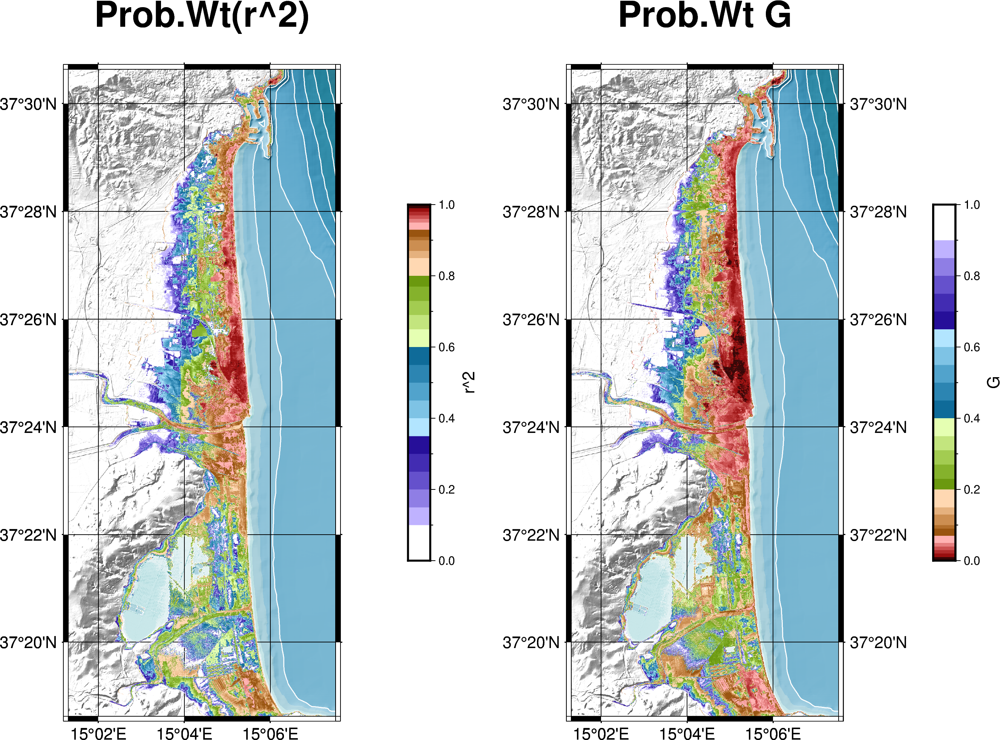

In [4]:
import pandas as pd
import numpy as np
import xarray as xr
import pygmt

#select particular representative gauge
reg = 'CT'
list_size = ['892','1658','3454','7071']   
columnname = str(38)
mask_size = '892'
train_size = list_size[1]

# Load the elevation from netcdf grid
grid_CT = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
#get lat long limits from the grid
ymin = grid_CT['y'].min().values
ymax = grid_CT['y'].max().values
xmin = grid_CT['x'].min().values
xmax = grid_CT['x'].max().values

grid_CT_P1 = xr.open_dataset('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2_topo_test.nc',engine='netcdf4')
temp = grid_CT_P1['r2topo']
temp = temp.where(temp>0,0)
grid_CT_P1['r2topo'] = temp

imp = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/out/model_direct_off[64, 128, 256]_on[16, 128, 128]_1658_compile_combined.csv', sep=",")

# Plot grid
fig = pygmt.Figure()

with fig.subplot(
        nrows=1,
        ncols=2,
        subsize = ["10c","20c"],
        sharey = True,
        frame = ["ag"],
        margins = ["0.5c","0.5c"],
        ):
    with fig.set_panel(panel=[0,0]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tProb.Wt(r^2)"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/r2only.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False)
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
        idx_val = idx_val[~(idx_val['r2_test_imp'] <= 0)]
        idx_val = idx_val[~idx_val['r2_test_imp'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['r2_test_imp'],style='s0.01c',cmap = True,projection='M6c',frame = ["ag"])
        fig.colorbar(frame=["x+lr^2"], position="JMR+o-1.5c/-2.5c+w8c/0.5c")
    with fig.set_panel(panel=[0,1]):
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy.cpt'
        cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        fig.grdimage(grid_CT['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tProb.Wt G"])
        fig.grdcontour(grid_CT['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cptfile = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/gonly.cpt'
        cmap = pygmt.makecpt(cmap=cptfile, continuous=False)
        idx_val = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/model/{reg}/PTHA/_Grid_scores_{train_size}_PSHalf.txt', sep=",")
        idx_val = idx_val[~idx_val['Gfit_test_imp'].isna()]
        fig.plot(x=idx_val['lon'], y=idx_val['lat'],fill=idx_val['Gfit_test_imp'],style='s0.01c',cmap = True,projection='M6c',frame = ["ag"])
        fig.colorbar(frame=["x+lG"], position="JMR+o-1c/-2.5c+w8c/0.5c")
#save
savefile = f'plots/Grid_scores_{train_size}_{reg}_ImpWt.png'
fig.savefig(savefile,dpi=300)
fig.show()